<a href="https://colab.research.google.com/github/MariaGorelik/Semantic_segmentation/blob/main/Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Сегментация изображений с камеры беспилотника

## Подготовка данных

### Скачивание данных

In [ ]:
! pip install wldhx.yadisk-direct

In [ ]:
!curl -L $(yadisk-direct https://disk.yandex.com/d/jJrOLbYlBYVESQ) -o lyft_segmentation.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 2620M  100 2620M    0     0  66.3M      0  0:00:39  0:00:39 --:--:-- 85.6M


In [ ]:
! unzip -qq lyft_segmentation.zip

### Загрузка датасета

In [ ]:
import numpy as np
import pandas as pd
from PIL import Image
import os
import matplotlib.pyplot as plt
import cv2

In [ ]:
DATA_ROOT = '/kaggle/input/lyft-udacity-challenge/'

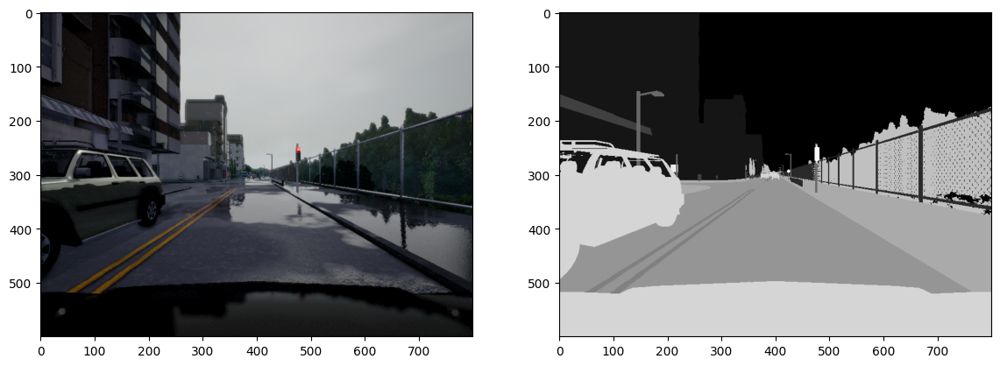

In [ ]:
img = plt.imread('./lyft_segmentation/images/02_00_000.png')
img_seg = plt.imread('./lyft_segmentation/segmentation_masks/02_00_000.png')

_, axes = plt.subplots(1,2, figsize=(14,10))
axes[0].imshow(img);
axes[1].imshow(img_seg[..., 0], cmap='gray');

#### Количество различных классов на картинке

In [ ]:
np.unique(img_seg * 255)

array([ 0.,  1.,  2.,  3.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.],
      dtype=float32)

In [ ]:
labels = {
    0: 'Unlabeled',
    1: 'Building',
    2: 'Fence',
    3: 'Other',
    4: 'Pedestrian',
    5: 'Pole',
    6: 'Roadline',
    7: 'Road',
    8: 'Sidewalk',
    9: 'Vegetation',
    10: 'Car',
    11: 'Wall',
    12: 'Traffic sign'
}

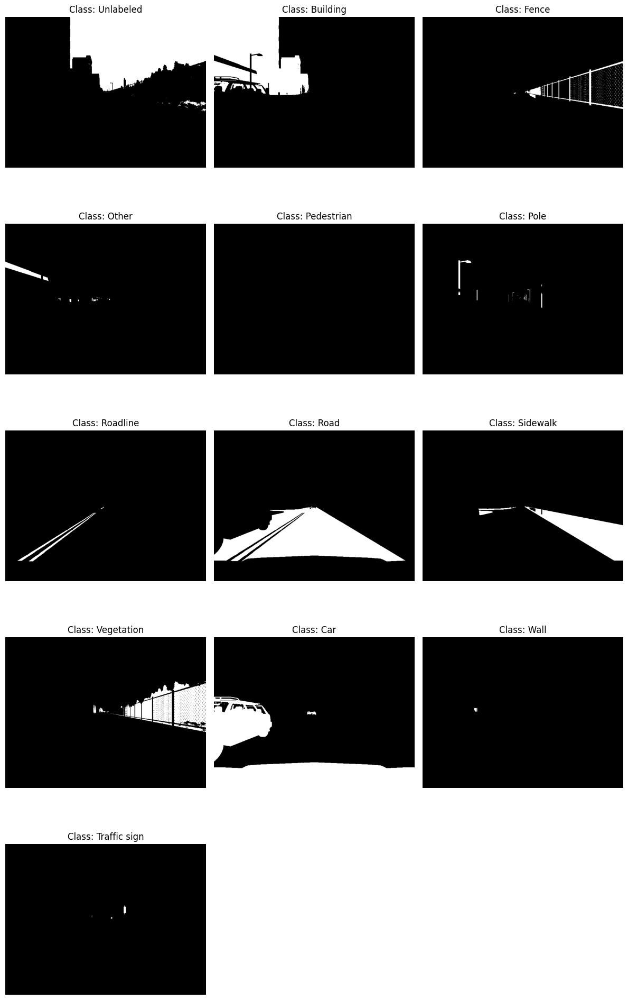

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

img = '02_00_001'

num_classes = 13
cols = 3
rows = (num_classes + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(12, rows * 4))

axes = axes.flatten()

for i in range(num_classes):
    mask = plt.imread(f'./lyft_segmentation/segmentation_masks/{img}.png') * 255
    mask = np.where(mask == i, 255, 0)
    mask = mask[:, :, 0]

    ax = axes[i]
    ax.imshow(mask, cmap='gray')
    ax.set_title(f'Class: {labels[i]}')
    ax.axis('off')

for j in range(num_classes, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [ ]:
images = []
segmentation_masks = []

for img_name in os.listdir('./lyft_segmentation/images/'):
    images.append('./lyft_segmentation/images/' + img_name)

for img_name in os.listdir('./lyft_segmentation/segmentation_masks/'):
    segmentation_masks.append('./lyft_segmentation/segmentation_masks/' + img_name)

In [ ]:
images[:5], segmentation_masks[:5]

(['./lyft_segmentation/images/06_00_220.png',
  './lyft_segmentation/images/02_01_238.png',
  './lyft_segmentation/images/03_01_084.png',
  './lyft_segmentation/images/07_00_207.png',
  './lyft_segmentation/images/F10-37.png'],
 ['./lyft_segmentation/segmentation_masks/06_00_220.png',
  './lyft_segmentation/segmentation_masks/02_01_238.png',
  './lyft_segmentation/segmentation_masks/03_01_084.png',
  './lyft_segmentation/segmentation_masks/07_00_207.png',
  './lyft_segmentation/segmentation_masks/F10-37.png'])

In [ ]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torch
from torch import nn
from torch.nn import functional as F
from torchvision import transforms

In [ ]:
class SelfDrivingDataset(Dataset):
    def __init__(self, images, segmentation_masks):

        self.images = images
        self.segmentation_masks = segmentation_masks

        self.images_transforms = transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
        ])

        self.masks_transforms = transforms.Compose([
            transforms.Resize((256, 256), interpolation=transforms.InterpolationMode.NEAREST),
            transforms.ToTensor(),
        ])

    def __getitem__(self, index):
        img = Image.open(self.images[index])
        mask = Image.open(self.segmentation_masks[index])
        img = self.images_transforms(img)
        mask = self.masks_transforms(mask)*255
        masks = []

        for i in range(13):
            cls_mask = torch.where(mask==i, 1, 0)
            masks.append(cls_mask[0,:,:].numpy())

        masks = torch.as_tensor(masks, dtype=torch.uint8)
        masks = torch.argmax(masks, axis=0)
        return (img, masks)

    def __len__(self):
        return len(self.images)

In [ ]:
labels_used = ['Unlabeled', 'Building', 'Fence', 'Other',
               'Pedestrian', 'Pole', 'Roadline', 'Road',
               'Sidewalk', 'Vegetation', 'Car', 'Wall',
               'Traffic sign']

<ipython-input-10-fbc2a5f84e08>:29: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:278.)
  masks = torch.as_tensor(masks, dtype=torch.uint8)


torch.Size([3, 256, 256]) torch.Size([256, 256])


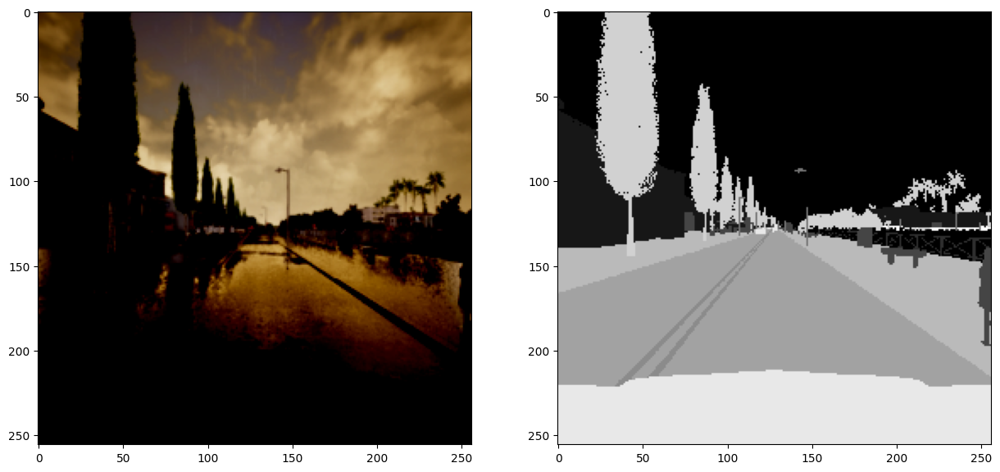

In [ ]:
dataset = SelfDrivingDataset(images, segmentation_masks)

img, mask = dataset[5]

print(img.shape, mask.shape)
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
ax[0].imshow(img.permute(1, 2, 0))
ax[1].imshow(mask, cmap='gray')
plt.show()

In [ ]:
train_size = int(len(dataset) * 0.5)
val_size = int(len(dataset) * 0.1)
test_size = len(dataset) - (train_size + val_size)

train_data, val_data, test_data = torch.utils.data.random_split(dataset, [train_size, val_size, test_size])

In [ ]:
print(train_size)
print(val_size)
print(test_size)

2500
500
2000


In [ ]:
print(len(test_data))

2000


In [ ]:
train_loader = torch.utils.data.DataLoader(train_data, batch_size=32, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=32, shuffle=False)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output

In [ ]:
class SegNet(nn.Module):
    def __init__(self, num_classes=13):
        super().__init__()
        # encoder (downsampling)
        self.enc_conv0 = nn.Conv2d(3, 8, kernel_size=3, padding=1)
        self.pool0 = nn.MaxPool2d((2, 2))  # 256 -> 128
        self.enc_bn0 = nn.BatchNorm2d(num_features=8)
        self.enc_conv1 = nn.Conv2d(8, 8, kernel_size=3, padding=1)
        self.pool1 = nn.MaxPool2d((2, 2)) # 128 -> 64
        self.enc_bn1 = nn.BatchNorm2d(num_features=8)
        self.enc_conv2 = nn.Conv2d(8, 16, kernel_size=3, padding=1)
        self.pool2 = nn.MaxPool2d((2, 2)) # 64 -> 32
        self.enc_bn2 = nn.BatchNorm2d(num_features=16)
        # bottleneck
        self.bottleneck_conv = nn.Conv2d(16, 16, kernel_size=1)
        # decoder (upsampling)
        self.upsample0 = nn.Upsample(scale_factor=2) # 32 -> 64
        self.dec_bn0 = nn.BatchNorm2d(num_features=32)
        self.dec_conv0 = nn.ConvTranspose2d(32, 8, 3, padding=1)
        self.upsample1 = nn.Upsample(scale_factor=2)  # 64 -> 128
        self.dec_bn1 = nn.BatchNorm2d(num_features=16)
        self.dec_conv1 = nn.ConvTranspose2d(16, 8, 3, padding=1)
        self.upsample2 = nn.Upsample(scale_factor=2)  # 128 -> 256
        self.dec_bn2 = nn.BatchNorm2d(num_features=16)
        self.dec_conv2 = nn.ConvTranspose2d(16, num_classes, 3, padding=1)

    def forward(self, x):
        # encoder
        e0 = self.enc_bn0(self.pool0(F.relu(self.enc_conv0(x))))
        e1 = self.enc_bn1(self.pool1(F.relu(self.enc_conv1(e0))))
        e2 = self.enc_bn2(self.pool2(F.relu(self.enc_conv2(e1))))
        # bottleneck
        b = self.bottleneck_conv(e2)
        # decoder
        d0 = self.dec_conv0(self.dec_bn0(F.relu(self.upsample0(torch.cat([b, e2], 1)))))
        d1 = self.dec_conv1(self.dec_bn1(F.relu(self.upsample1(torch.cat([d0, e1], 1)))))
        d2 = self.dec_conv2(self.dec_bn2(F.relu(self.upsample2(torch.cat([d1, e0], 1)))))
        return d2

In [ ]:
from IPython.display import clear_output

train_losses = []
val_losses = []

def train(model, opt, loss_fn, epochs, data_train, data_val, labels_used):
    for epoch in range(epochs):
        print('* Epoch %d/%d' % (epoch+1, epochs))

        model.train()
        train_loss = 0
        for X_batch, Y_batch in data_train:
            X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)

            Y_pred = model(X_batch)
            loss = loss_fn(Y_pred, Y_batch.long())
            loss.backward()
            opt.step()
            opt.zero_grad()

            train_loss += loss.item()
            train_losses.append(loss.item())

        train_loss /= len(data_train)
        print('Train Loss: %.4f' % train_loss)

        model.eval()
        val_loss = 0
        with torch.no_grad():
            for X_val, Y_val in data_val:
                X_val, Y_val = X_val.to(device), Y_val.to(device)

                Y_pred = model(X_val)
                loss = loss_fn(Y_pred, Y_val.long())
                val_loss += loss.item()
                val_losses.append(loss.item())

        val_loss /= len(data_val)
        print('Validation Loss: %.4f' % val_loss)

        if epoch == epochs - 1:
            X_val, Y_val = next(iter(data_val))
            Y_pred = model(X_val.to(device))
            Y_hat = Y_pred.detach().cpu().numpy()
            Y_hat = np.argmax(Y_hat, axis=1)

            num_images = min(6, len(X_val))
            num_rows = 2 + len(labels_used)
            _, axes = plt.subplots(num_rows, num_images, figsize=(num_images*4, num_rows*4))

            for k in range(num_images):
                axes[0][k].imshow(np.rollaxis(X_val[k].numpy(), 0, 3), aspect='auto')
                axes[0][k].axis('off')
                axes[0][k].title.set_text('Input')

                axes[1][k].imshow(Y_val[k].numpy(), cmap='gray', aspect='auto')
                axes[1][k].axis('off')
                axes[1][k].title.set_text('Real Map')

                for j in range(len(labels_used)):
                    axes[j+2][k].imshow(np.where(Y_hat[k] == j, 1, 0), cmap='gray', aspect='auto')
                    axes[j+2][k].axis('off')
                    axes[j+2][k].title.set_text('Output for {}'.format(labels_used[j]))

            plt.suptitle('Final Predictions - Epoch %d\nTrain Loss: %.4f | Validation Loss: %.4f' %
                         (epoch+1, train_loss, val_loss))
            plt.show()

In [ ]:
import os
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'expandable_segments:True'

* Epoch 1/10
Train Loss: 1.3468
Validation Loss: 0.9722
* Epoch 2/10
Train Loss: 0.8180
Validation Loss: 0.7631
* Epoch 3/10
Train Loss: 0.6943
Validation Loss: 0.6923
* Epoch 4/10
Train Loss: 0.6338
Validation Loss: 0.6034
* Epoch 5/10
Train Loss: 0.5885
Validation Loss: 0.5845
* Epoch 6/10
Train Loss: 0.5578
Validation Loss: 0.6296
* Epoch 7/10
Train Loss: 0.5366
Validation Loss: 0.5404
* Epoch 8/10
Train Loss: 0.5244
Validation Loss: 0.6962
* Epoch 9/10
Train Loss: 0.5114
Validation Loss: 0.5009
* Epoch 10/10
Train Loss: 0.4966
Validation Loss: 0.4950


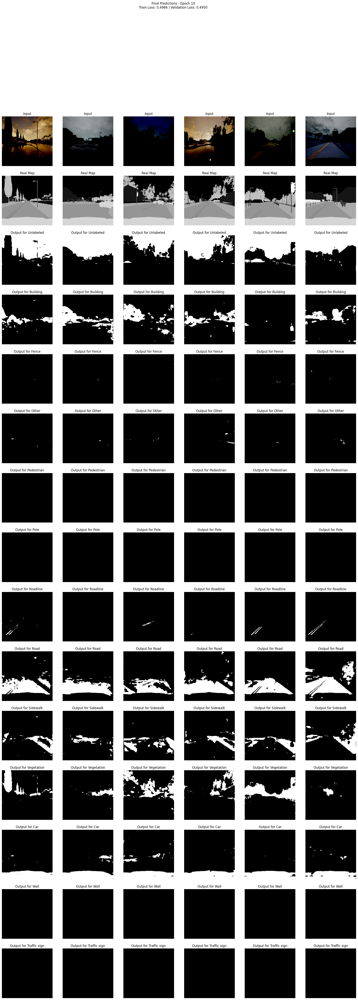

In [ ]:
model = SegNet().to(device)
loss = nn.CrossEntropyLoss()
opt = torch.optim.Adam(model.parameters(), lr=1e-3)
train(model, opt, loss, 10, train_loader, val_loader, labels_used)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
save_path = '/content/drive/My Drive/ФПМИ/3 курс/5 сем/курсач/segnet_model.pth'

torch.save(model.state_dict(), save_path)

* Epoch 1/5
Train Loss: 0.4860
Validation Loss: 0.5489
* Epoch 2/5
Train Loss: 0.4803
Validation Loss: 0.6640
* Epoch 3/5
Train Loss: 0.4786
Validation Loss: 0.6918
* Epoch 4/5
Train Loss: 0.4669
Validation Loss: 0.5072
* Epoch 5/5
Train Loss: 0.4573
Validation Loss: 0.4817


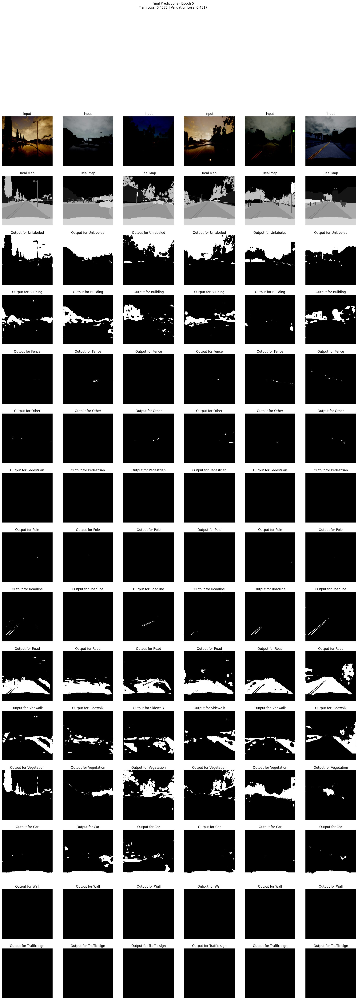

In [ ]:
train(model, opt, loss, 5, train_loader, val_loader, labels_used)

In [ ]:
save_path = '/content/drive/My Drive/ФПМИ/3 курс/5 сем/курсач/segnet_model_15_ep.pth'

torch.save(model.state_dict(), save_path)

* Epoch 1/5
Train Loss: 0.4545
Validation Loss: 0.5834
* Epoch 2/5
Train Loss: 0.4480
Validation Loss: 0.5237
* Epoch 3/5
Train Loss: 0.4420
Validation Loss: 0.4399
* Epoch 4/5
Train Loss: 0.4391
Validation Loss: 0.5718
* Epoch 5/5
Train Loss: 0.4390
Validation Loss: 0.5272


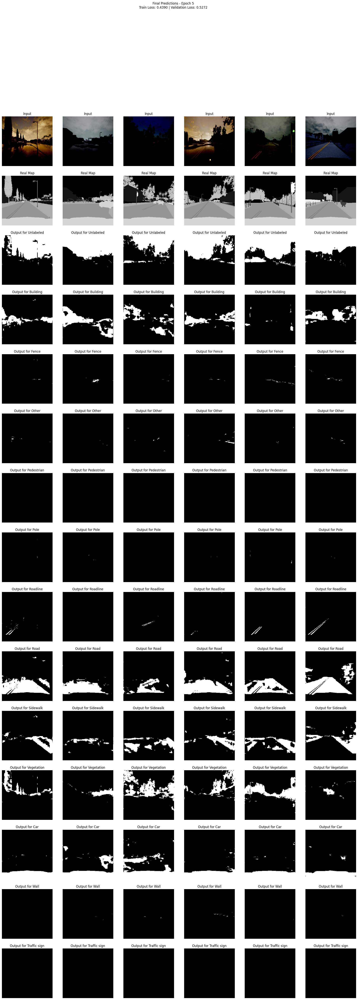

In [ ]:
train(model, opt, loss, 5, train_loader, val_loader, labels_used)

In [ ]:
save_path = '/content/drive/My Drive/ФПМИ/3 курс/5 сем/курсач/segnet_model_20_ep.pth'

torch.save(model.state_dict(), save_path)

* Epoch 1/5
Train Loss: 0.4463
Validation Loss: 0.4280
* Epoch 2/5
Train Loss: 0.4325
Validation Loss: 0.7857
* Epoch 3/5
Train Loss: 0.4256
Validation Loss: 0.4281
* Epoch 4/5
Train Loss: 0.4184
Validation Loss: 0.4594
* Epoch 5/5
Train Loss: 0.4197
Validation Loss: 0.4194


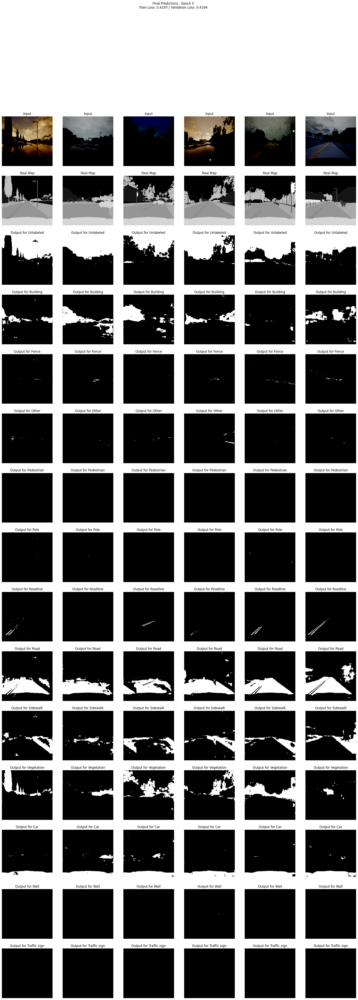

In [ ]:
train(model, opt, loss, 5, train_loader, val_loader, labels_used)

In [ ]:
save_path = '/content/drive/My Drive/ФПМИ/3 курс/5 сем/курсач/segnet_model_25_ep.pth'

torch.save(model.state_dict(), save_path)

* Epoch 1/5
Train Loss: 0.4125
Validation Loss: 0.5811
* Epoch 2/5
Train Loss: 0.4110
Validation Loss: 0.5160
* Epoch 3/5
Train Loss: 0.4239
Validation Loss: 2.2378
* Epoch 4/5
Train Loss: 0.4565
Validation Loss: 0.6080
* Epoch 5/5
Train Loss: 0.4118
Validation Loss: 0.4569


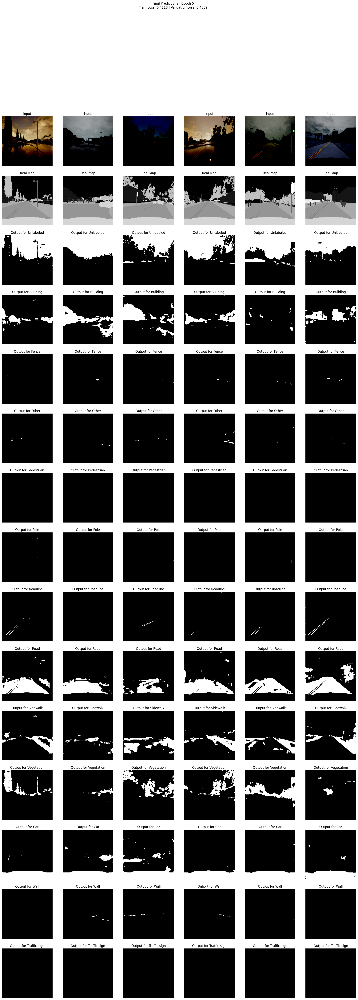

In [ ]:
train(model, opt, loss, 5, train_loader, val_loader, labels_used)

In [ ]:
save_path = '/content/drive/My Drive/ФПМИ/3 курс/5 сем/курсач/segnet_model_30_ep.pth'

torch.save(model.state_dict(), save_path)

In [ ]:
print(device)

cuda


In [ ]:
load_path = '/content/drive/My Drive/ФПМИ/3 курс/5 сем/курсач/segnet_model_30_ep.pth'

model = SegNet(num_classes=13).to(device)

model.load_state_dict(torch.load(load_path))
model.train()

<ipython-input-24-2f9e34bedfe8>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(load_path))


SegNet(
  (enc_conv0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool0): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (enc_bn0): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (enc_conv1): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (enc_bn1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (enc_conv2): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (enc_bn2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bottleneck_conv): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1))
  (upsample0): Upsample(scale_factor=2.0, mode='nearest')
  (dec_bn0): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine

* Epoch 1/5
Train Loss: 0.4176
Validation Loss: 0.4790
* Epoch 2/5
Train Loss: 0.4018
Validation Loss: 0.4476
* Epoch 3/5
Train Loss: 0.4015
Validation Loss: 0.5044
* Epoch 4/5
Train Loss: 0.3984
Validation Loss: 0.5772
* Epoch 5/5
Train Loss: 0.3992
Validation Loss: 0.5759


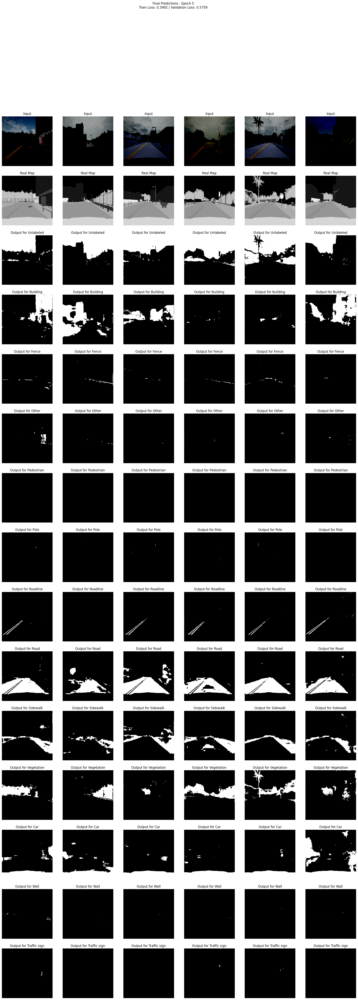

In [ ]:
loss = nn.CrossEntropyLoss()
opt = torch.optim.Adam(model.parameters(), lr=1e-3)

train(model, opt, loss, 5, train_loader, val_loader, labels_used)

In [ ]:
save_path = '/content/drive/My Drive/ФПМИ/3 курс/5 сем/курсач/segnet_model_35_ep.pth'

torch.save(model.state_dict(), save_path)

* Epoch 1/2
Train Loss: 0.3971
Validation Loss: 0.4672
* Epoch 2/2
Train Loss: 0.4014
Validation Loss: 0.4273


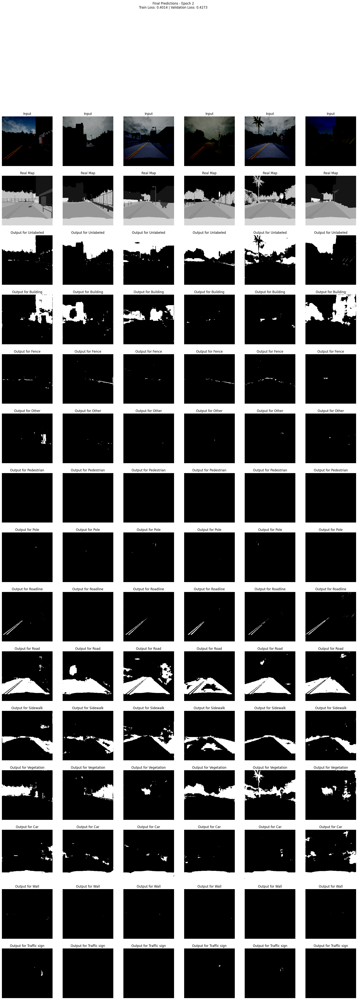

In [ ]:
train(model, opt, loss, 2, train_loader, val_loader, labels_used)

In [ ]:
save_path = '/content/drive/My Drive/ФПМИ/3 курс/5 сем/курсач/segnet_model_37_ep.pth'

torch.save(model.state_dict(), save_path)

* Epoch 1/3
Train Loss: 0.3941
Validation Loss: 0.4221
* Epoch 2/3
Train Loss: 0.3929
Validation Loss: 0.5624
* Epoch 3/3
Train Loss: 0.3925
Validation Loss: 0.4047


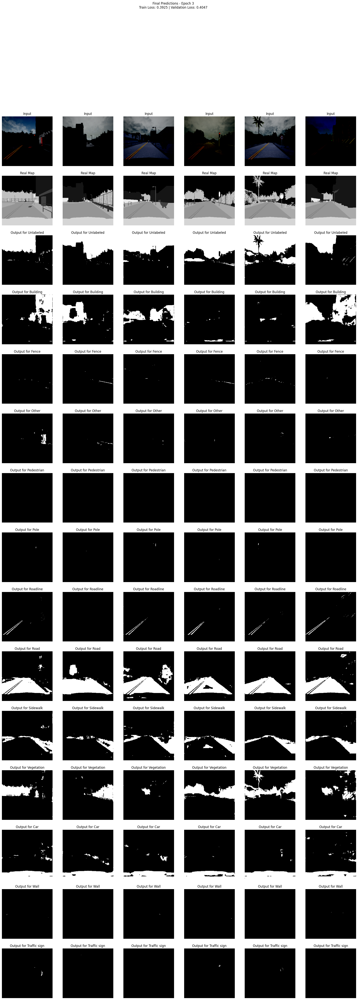

In [ ]:
train(model, opt, loss, 3, train_loader, val_loader, labels_used)

In [ ]:
save_path = '/content/drive/My Drive/ФПМИ/3 курс/5 сем/курсач/segnet_model_40_ep.pth'

torch.save(model.state_dict(), save_path)

In [ ]:
load_path = '/content/drive/My Drive/ФПМИ/3 курс/5 сем/курсач/segnet_model_40_ep.pth'

model = SegNet(num_classes=13).to(device)

model.load_state_dict(torch.load(load_path))
model.eval()

<ipython-input-25-d47430b4cfdf>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(load_path))


SegNet(
  (enc_conv0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool0): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (enc_bn0): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (enc_conv1): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (enc_bn1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (enc_conv2): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (enc_bn2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bottleneck_conv): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1))
  (upsample0): Upsample(scale_factor=2.0, mode='nearest')
  (dec_bn0): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine

In [ ]:
test_loader = torch.utils.data.DataLoader(test_data, batch_size=32, shuffle=False)

In [ ]:
print(device)

cuda


In [ ]:
import matplotlib.pyplot as plt

train_losses = [1.3468, 0.8180, 0.6943, 0.6338, 0.5885, 0.5578, 0.5366, 0.5244, 0.5114, 0.4966,
                0.4860, 0.4803, 0.4786, 0.4669, 0.4573, 0.4545, 0.4480, 0.4420, 0.4391, 0.4390,
                0.4463, 0.4325, 0.4256, 0.4184, 0.4197, 0.4125, 0.4110, 0.4239, 0.4565, 0.4118,
                0.4176, 0.4018, 0.4015, 0.3984, 0.3992, 0.3971, 0.4014, 0.3941, 0.3929, 0.3925]
val_losses = [0.9722, 0.7631, 0.6923, 0.6034, 0.5845, 0.6296, 0.5404, 0.6962, 0.5009, 0.4950,
              0.5489, 0.6640, 0.6918, 0.5072, 0.4817, 0.5834, 0.5237, 0.4399, 0.5718, 0.5272,
              0.4280, 0.7857, 0.4281, 0.4594, 0.4194, 0.5811, 0.5160, 2.2378, 0.6080, 0.4569,
              0.4790, 0.4476, 0.5044, 0.5772, 0.5759, 0.4672, 0.4273, 0.4221, 0.5624, 0.4047]

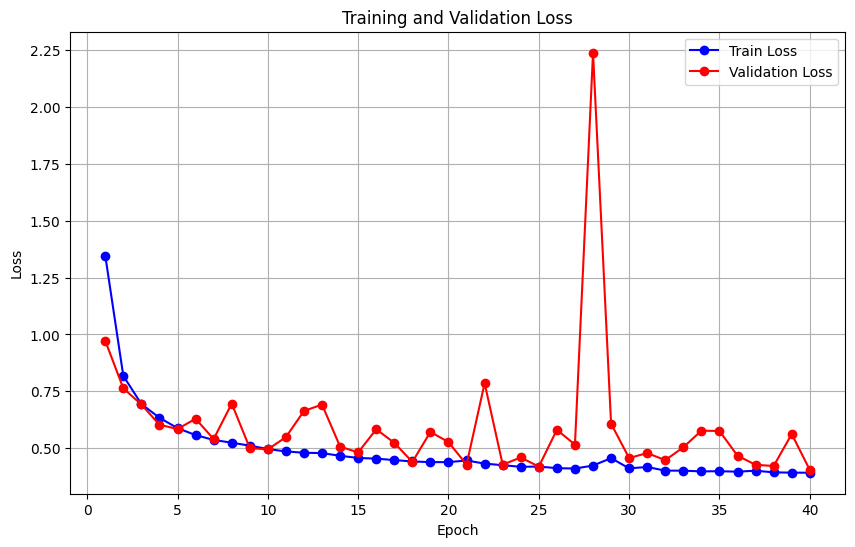

In [ ]:
epochs = list(range(1, len(train_losses) + 1))

plt.figure(figsize=(10, 6))
plt.plot(epochs, train_losses, label="Train Loss", color="blue", marker="o")
plt.plot(epochs, val_losses, label="Validation Loss", color="red", marker="o")

plt.title("Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
loss_fn = nn.CrossEntropyLoss()

model.eval()
test_loss = 0
with torch.no_grad():
    for X_test, Y_test in test_loader:
        X_test, Y_test = X_test.to(device), Y_test.to(device)

        Y_pred = model(X_test)
        loss = loss_fn(Y_pred, Y_test.long())
        test_loss += loss.item()

test_loss /= len(test_loader)
print('Test Loss: %.4f' % test_loss)

Test Loss: 0.4045


In [ ]:
model.eval()
val_loss = 0
with torch.no_grad():
    for X_val, Y_val in val_loader:
        X_val, Y_val = X_val.to(device), Y_val.to(device)

        Y_pred = model(X_val)
        loss = loss_fn(Y_pred, Y_val.long())
        val_loss += loss.item()
        val_losses.append(loss.item())

val_loss /= len(val_loader)
print('Validation Loss: %.4f' % val_loss)

Validation Loss: 0.4010


In [ ]:
def calculate_iou(predicted, ground_truth, num_classes):
    iou_per_class = []

    for cls in range(num_classes):
        pred_cls = (predicted == cls)
        gt_cls = (ground_truth == cls)

        intersection = (pred_cls & gt_cls).sum().item()
        union = (pred_cls | gt_cls).sum().item()

        if union == 0:
            iou = float('nan')
        else:
            iou = intersection / union

        iou_per_class.append(iou)

    return iou_per_class

In [ ]:
num_classes = 13

model.eval()
ious = []

with torch.no_grad():
    for X_test, Y_test in test_loader:
        X_test = X_test.to(device)
        Y_test = Y_test.to(device)

        Y_pred = model(X_test)
        Y_pred_classes = torch.argmax(Y_pred, dim=1)

        for pred, gt in zip(Y_pred_classes, Y_test):
            iou_per_image = calculate_iou(pred.cpu(), gt.cpu(), num_classes)
            ious.append(iou_per_image)

mean_ious = torch.tensor(ious).nanmean(dim=0)
mean_iou = mean_ious.nanmean().item()
print(f"Среднее IoU по всем изображениям: {mean_iou:.4f}")
for cls, iou in enumerate(mean_ious):
    print(f"IoU для класса {labels[cls]}: {iou:.4f}")

Среднее IoU по всем изображениям: 0.3974
IoU для класса 0: 0.9106
IoU для класса 1: 0.4711
IoU для класса 2: 0.0354
IoU для класса 3: 0.0695
IoU для класса 4: 0.0000
IoU для класса 5: 0.0147
IoU для класса 6: 0.5901
IoU для класса 7: 0.8545
IoU для класса 8: 0.6194
IoU для класса 9: 0.6827
IoU для класса 10: 0.8816
IoU для класса 11: 0.0140
IoU для класса 12: 0.0229


In [ ]:
print(f"Среднее IoU по всем изображениям: {mean_iou:.4f}")
for cls, iou in enumerate(mean_ious):
    print(f"IoU для класса {labels[cls]}: {iou:.4f}")

Среднее IoU по всем изображениям: 0.3974
IoU для класса Unlabeled: 0.9106
IoU для класса Building: 0.4711
IoU для класса Fence: 0.0354
IoU для класса Other: 0.0695
IoU для класса Pedestrian: 0.0000
IoU для класса Pole: 0.0147
IoU для класса Roadline: 0.5901
IoU для класса Road: 0.8545
IoU для класса Sidewalk: 0.6194
IoU для класса Vegetation: 0.6827
IoU для класса Car: 0.8816
IoU для класса Wall: 0.0140
IoU для класса Traffic sign: 0.0229


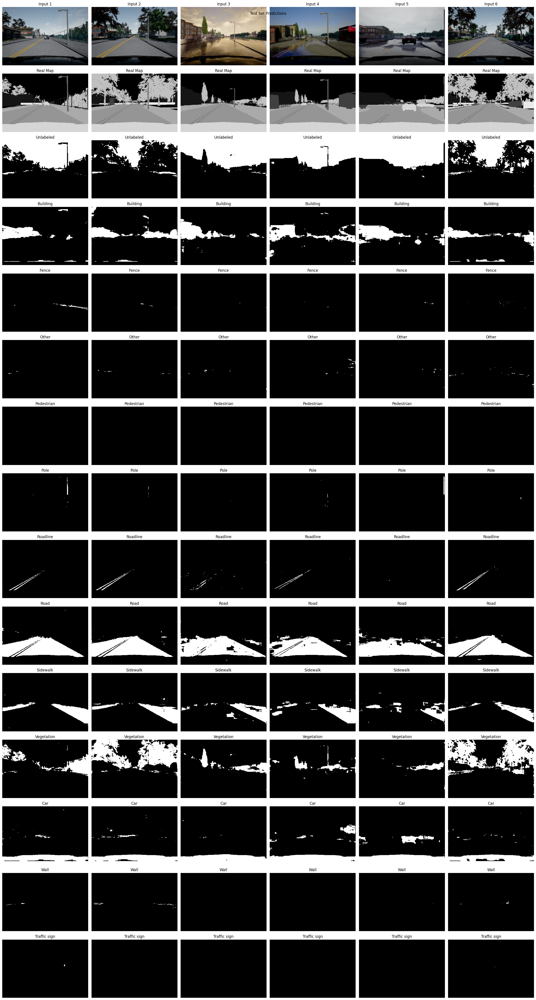

In [ ]:
model.eval()
test_images, test_masks = next(iter(test_loader))
test_images, test_masks = test_images[:6], test_masks[:6]
test_images, test_masks = test_images.to(device), test_masks.to(device)

with torch.no_grad():
    test_preds = model(test_images)
test_preds = test_preds.detach().cpu().numpy()
test_preds_classes = np.argmax(test_preds, axis=1)

num_images = 6
num_rows = 2 + len(labels_used)
fig, axes = plt.subplots(num_rows, num_images, figsize=(num_images * 4, num_rows * 3))

for k in range(num_images):
    input_img = test_images[k].cpu()
    input_img = denormalize(input_img).permute(1, 2, 0).numpy()

    axes[0, k].imshow(input_img, aspect='auto')
    axes[0, k].axis('off')
    axes[0, k].title.set_text(f'Input {k + 1}')

    axes[1, k].imshow(test_masks[k].cpu().numpy(), cmap='gray', aspect='auto')
    axes[1, k].axis('off')
    axes[1, k].title.set_text('Real Map')

    for j in range(len(labels_used)):
        class_mask = (test_preds_classes[k] == j).astype(np.uint8)
        axes[j + 2, k].imshow(class_mask, cmap='gray', aspect='auto')
        axes[j + 2, k].axis('off')
        axes[j + 2, k].title.set_text(labels_used[j])

plt.suptitle('Test Set Predictions')
plt.tight_layout()
plt.show()

### Визуализация результатов

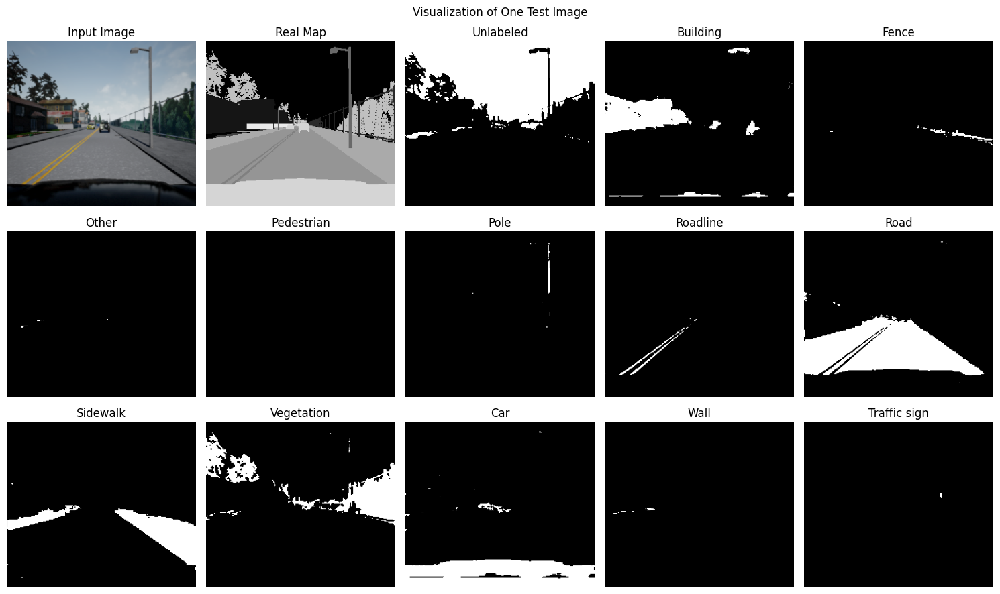

In [ ]:
model.eval()
test_image, test_mask = next(iter(test_loader))
test_image, test_mask = test_image[0:1], test_mask[0:1]
test_image, test_mask = test_image.to(device), test_mask.to(device)

with torch.no_grad():
    test_pred = model(test_image)
test_pred = test_pred.detach().cpu().numpy()
test_pred_classes = np.argmax(test_pred, axis=1)[0]

input_img = denormalize(test_image[0].cpu()).permute(1, 2, 0).numpy()
real_mask = test_mask[0].cpu().numpy()

fig, axes = plt.subplots(3, 5, figsize=(15, 9))
axes = axes.flatten()

axes[0].imshow(input_img, aspect='auto')
axes[0].axis('off')
axes[0].title.set_text('Input Image')

axes[1].imshow(real_mask, cmap='gray', aspect='auto')
axes[1].axis('off')
axes[1].title.set_text('Real Map')

for j in range(len(labels_used)):
    class_mask = (test_pred_classes == j).astype(np.uint8)
    axes[j + 2].imshow(class_mask, cmap='gray', aspect='auto')
    axes[j + 2].axis('off')
    axes[j + 2].title.set_text(labels_used[j])

for i in range(len(labels_used) + 2, len(axes)):
    axes[i].axis('off')

plt.suptitle('Visualization of One Test Image')
plt.tight_layout()
plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
load_path = '/content/drive/My Drive/ФПМИ/3 курс/5 сем/курсач/segnet_model_40_ep.pth'

model = SegNet(num_classes=13).to(device)

model.load_state_dict(torch.load(load_path))
model.eval()

<ipython-input-21-d47430b4cfdf>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(load_path))


SegNet(
  (enc_conv0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool0): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (enc_bn0): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (enc_conv1): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (enc_bn1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (enc_conv2): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (enc_bn2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bottleneck_conv): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1))
  (upsample0): Upsample(scale_factor=2.0, mode='nearest')
  (dec_bn0): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine

In [ ]:
def denormalize(tensor, mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]):
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    return tensor * std + mean


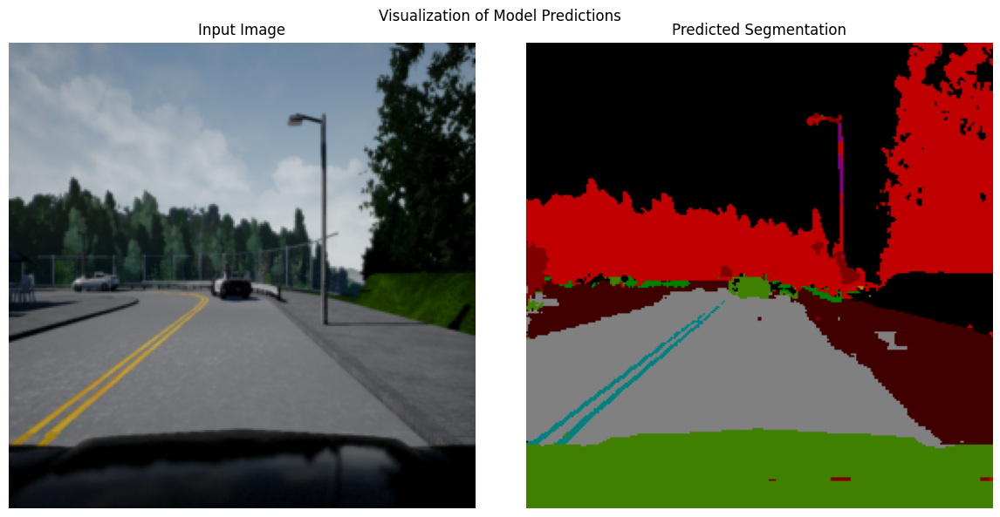

In [ ]:
# Определение цветовой палитры для классов (RGB)
palette = np.array([
    [0, 0, 0],         # Unlabeled
    [128, 0, 0],       # Building
    [0, 128, 0],       # Fence
    [128, 128, 0],     # Other
    [0, 0, 128],       # Pedestrian
    [128, 0, 128],     # Pole
    [0, 128, 128],     # Roadline
    [128, 128, 128],   # Road
    [64, 0, 0],        # Sidewalk
    [192, 0, 0],       # Vegetation
    [64, 128, 0],      # Car
    [192, 128, 0],     # Wall
    [64, 0, 128],      # Traffic sign
])

def colorize_mask(mask, palette):
    color_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for cls_id, color in enumerate(palette):
        color_mask[mask == cls_id] = color
    return color_mask

model.eval()
test_image, test_mask = next(iter(test_loader))
test_image, test_mask = test_image[10:11], test_mask[10:11]
test_image = test_image.to(device)

with torch.no_grad():
    test_pred = model(test_image)
test_pred = test_pred.detach().cpu().numpy()
test_pred_classes = np.argmax(test_pred, axis=1)[0]

input_img = denormalize(test_image[0].cpu()).permute(1, 2, 0).numpy()
colored_pred = colorize_mask(test_pred_classes, palette)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(input_img)
axes[0].axis('off')
axes[0].title.set_text('Input Image')

axes[1].imshow(colored_pred)
axes[1].axis('off')
axes[1].title.set_text('Predicted Segmentation')

plt.suptitle('Visualization of Model Predictions')
plt.tight_layout()
plt.show()

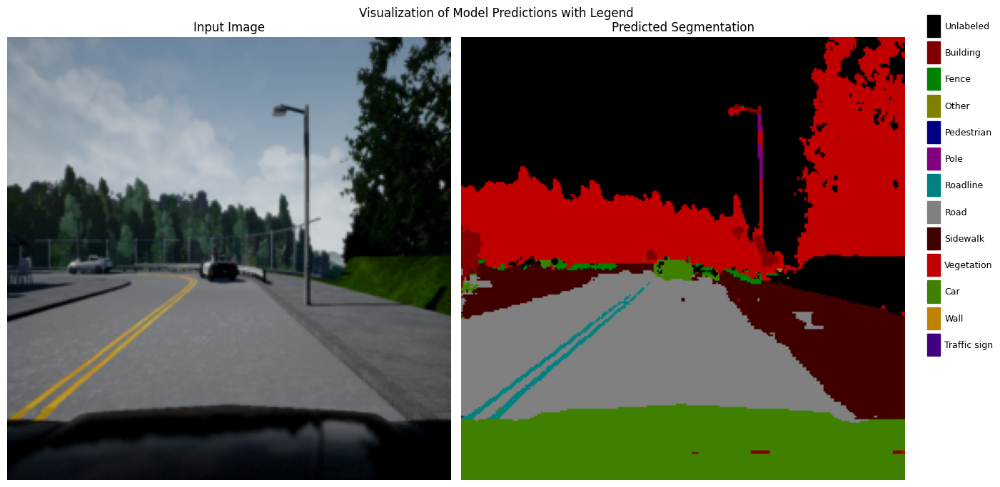

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

axes[0].imshow(input_img)
axes[0].axis('off')
axes[0].title.set_text('Input Image')

axes[1].imshow(colored_pred)
axes[1].axis('off')
axes[1].title.set_text('Predicted Segmentation')

legend_colors = [palette[i] / 255 for i in range(len(palette))]
legend_labels = [
    "Unlabeled", "Building", "Fence", "Other", "Pedestrian", "Pole",
    "Roadline", "Road", "Sidewalk", "Vegetation", "Car", "Wall", "Traffic sign"
]

x_start = 1.05
y_start = 1.0

for i, (color, label) in enumerate(zip(legend_colors, legend_labels)):
    y_offset = y_start - (i * 0.06)
    axes[1].add_patch(plt.Rectangle((x_start, y_offset), 0.03, 0.05, color=color, transform=axes[1].transAxes, clip_on=False))
    axes[1].text(x_start + 0.04, y_offset + 0.025, label, transform=axes[1].transAxes, va='center', fontsize=9)

plt.suptitle('Visualization of Model Predictions with Legend')
plt.tight_layout()
plt.show()